In [1]:

# imports
import os
import sys
import types
import json
import base64

# figure size/format
fig_width = 7
fig_height = 5
fig_format = 'retina'
fig_dpi = 96
interactivity = ''
is_shiny = False
is_dashboard = False
plotly_connected = True

# matplotlib defaults / format
try:
  import matplotlib.pyplot as plt
  plt.rcParams['figure.figsize'] = (fig_width, fig_height)
  plt.rcParams['figure.dpi'] = fig_dpi
  plt.rcParams['savefig.dpi'] = "figure"
  from IPython.display import set_matplotlib_formats
  set_matplotlib_formats(fig_format)
except Exception:
  pass

# plotly use connected mode
try:
  import plotly.io as pio
  if plotly_connected:
    pio.renderers.default = "notebook_connected"
  else:
    pio.renderers.default = "notebook"
  for template in pio.templates.keys():
    pio.templates[template].layout.margin = dict(t=30,r=0,b=0,l=0)
except Exception:
  pass

# disable itables paging for dashboards
if is_dashboard:
  try:
    from itables import options
    options.dom = 'fiBrtlp'
    options.maxBytes = 1024 * 1024
    options.language = dict(info = "Showing _TOTAL_ entries")
    options.classes = "display nowrap compact"
    options.paging = False
    options.searching = True
    options.ordering = True
    options.info = True
    options.lengthChange = False
    options.autoWidth = False
    options.responsive = True
    options.keys = True
    options.buttons = []
  except Exception:
    pass
  
  try:
    import altair as alt
    # By default, dashboards will have container sized
    # vega visualizations which allows them to flow reasonably
    theme_sentinel = '_quarto-dashboard-internal'
    def make_theme(name):
        nonTheme = alt.themes._plugins[name]    
        def patch_theme(*args, **kwargs):
            existingTheme = nonTheme()
            if 'height' not in existingTheme:
              existingTheme['height'] = 'container'
            if 'width' not in existingTheme:
              existingTheme['width'] = 'container'

            if 'config' not in existingTheme:
              existingTheme['config'] = dict()
            
            # Configure the default font sizes
            title_font_size = 15
            header_font_size = 13
            axis_font_size = 12
            legend_font_size = 12
            mark_font_size = 12
            tooltip = False

            config = existingTheme['config']

            # The Axis
            if 'axis' not in config:
              config['axis'] = dict()
            axis = config['axis']
            if 'labelFontSize' not in axis:
              axis['labelFontSize'] = axis_font_size
            if 'titleFontSize' not in axis:
              axis['titleFontSize'] = axis_font_size  

            # The legend
            if 'legend' not in config:
              config['legend'] = dict()
            legend = config['legend']
            if 'labelFontSize' not in legend:
              legend['labelFontSize'] = legend_font_size
            if 'titleFontSize' not in legend:
              legend['titleFontSize'] = legend_font_size  

            # The header
            if 'header' not in config:
              config['header'] = dict()
            header = config['header']
            if 'labelFontSize' not in header:
              header['labelFontSize'] = header_font_size
            if 'titleFontSize' not in header:
              header['titleFontSize'] = header_font_size    

            # Title
            if 'title' not in config:
              config['title'] = dict()
            title = config['title']
            if 'fontSize' not in title:
              title['fontSize'] = title_font_size

            # Marks
            if 'mark' not in config:
              config['mark'] = dict()
            mark = config['mark']
            if 'fontSize' not in mark:
              mark['fontSize'] = mark_font_size

            # Mark tooltips
            if tooltip and 'tooltip' not in mark:
              mark['tooltip'] = dict(content="encoding")

            return existingTheme
            
        return patch_theme

    # We can only do this once per session
    if theme_sentinel not in alt.themes.names():
      for name in alt.themes.names():
        alt.themes.register(name, make_theme(name))
      
      # register a sentinel theme so we only do this once
      alt.themes.register(theme_sentinel, make_theme('default'))
      alt.themes.enable('default')

  except Exception:
    pass

# enable pandas latex repr when targeting pdfs
try:
  import pandas as pd
  if fig_format == 'pdf':
    pd.set_option('display.latex.repr', True)
except Exception:
  pass

# interactivity
if interactivity:
  from IPython.core.interactiveshell import InteractiveShell
  InteractiveShell.ast_node_interactivity = interactivity

# NOTE: the kernel_deps code is repeated in the cleanup.py file
# (we can't easily share this code b/c of the way it is run).
# If you edit this code also edit the same code in cleanup.py!

# output kernel dependencies
kernel_deps = dict()
for module in list(sys.modules.values()):
  # Some modules play games with sys.modules (e.g. email/__init__.py
  # in the standard library), and occasionally this can cause strange
  # failures in getattr.  Just ignore anything that's not an ordinary
  # module.
  if not isinstance(module, types.ModuleType):
    continue
  path = getattr(module, "__file__", None)
  if not path:
    continue
  if path.endswith(".pyc") or path.endswith(".pyo"):
    path = path[:-1]
  if not os.path.exists(path):
    continue
  kernel_deps[path] = os.stat(path).st_mtime
print(json.dumps(kernel_deps))

# set run_path if requested
run_path = 'L1VzZXJzL2VyZGVta2FyYWtveWx1L3Byb2pleC9wb3J0Zm9saW8vcG9ydGZvbGlvL2VsZWN0aW9uc19lc3Rvbmlh'
if run_path:
  # hex-decode the path
  run_path = base64.b64decode(run_path.encode("utf-8")).decode("utf-8")
  os.chdir(run_path)

# reset state
%reset

# shiny
# Checking for shiny by using False directly because we're after the %reset. We don't want
# to set a variable that stays in global scope.
if False:
  try:
    import htmltools as _htmltools
    import ast as _ast

    _htmltools.html_dependency_render_mode = "json"

    # This decorator will be added to all function definitions
    def _display_if_has_repr_html(x):
      try:
        # IPython 7.14 preferred import
        from IPython.display import display, HTML
      except:
        from IPython.core.display import display, HTML

      if hasattr(x, '_repr_html_'):
        display(HTML(x._repr_html_()))
      return x

    # ideally we would undo the call to ast_transformers.append
    # at the end of this block whenver an error occurs, we do 
    # this for now as it will only be a problem if the user 
    # switches from shiny to not-shiny mode (and even then likely
    # won't matter)
    import builtins
    builtins._display_if_has_repr_html = _display_if_has_repr_html

    class _FunctionDefReprHtml(_ast.NodeTransformer):
      def visit_FunctionDef(self, node):
        node.decorator_list.insert(
          0,
          _ast.Name(id="_display_if_has_repr_html", ctx=_ast.Load())
        )
        return node

      def visit_AsyncFunctionDef(self, node):
        node.decorator_list.insert(
          0,
          _ast.Name(id="_display_if_has_repr_html", ctx=_ast.Load())
        )
        return node

    ip = get_ipython()
    ip.ast_transformers.append(_FunctionDefReprHtml())

  except:
    pass

def ojs_define(**kwargs):
  import json
  try:
    # IPython 7.14 preferred import
    from IPython.display import display, HTML
  except:
    from IPython.core.display import display, HTML

  # do some minor magic for convenience when handling pandas
  # dataframes
  def convert(v):
    try:
      import pandas as pd
    except ModuleNotFoundError: # don't do the magic when pandas is not available
      return v
    if type(v) == pd.Series:
      v = pd.DataFrame(v)
    if type(v) == pd.DataFrame:
      j = json.loads(v.T.to_json(orient='split'))
      return dict((k,v) for (k,v) in zip(j["index"], j["data"]))
    else:
      return v

  v = dict(contents=list(dict(name=key, value=convert(value)) for (key, value) in kwargs.items()))
  display(HTML('<script type="ojs-define">' + json.dumps(v) + '</script>'), metadata=dict(ojs_define = True))
globals()["ojs_define"] = ojs_define
globals()["__spec__"] = None

{"/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/importlib/_bootstrap.py": 1733408734.471264, "/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/importlib/_bootstrap_external.py": 1733408734.4749234, "/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/zipimport.py": 1733408732.9002094, "/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/codecs.py": 1733408732.3210196, "/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/encodings/aliases.py": 1733408733.3980114, "/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/encodings/__init__.py": 1733408733.3914618, "/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/encodings/utf_8.py": 1733408733.9695811, "/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/abc.py": 1733408732.2604675, "/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/io.py": 1733408732.4908507, "/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/stat.py

/var/folders/c9/p_x94m2j357984db558g2n9m0000gn/T/ipykernel_43496/4242055366.py:25: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats(fig_format)


In [2]:
import arviz as az
import matplotlib.pyplot as pp
from matplotlib import rcParams
import numpy as np
import pandas as pd

import pymc as pm

In [3]:
rcParams['font.size'] = 12

In [4]:
data = pd.read_csv('~/projex/elections/data/estonian-data.csv')

In [5]:
data.head().T

,0,1,2,3,4
age_group,16-24,16-24,16-24,16-24,16-24
education,Basic education,Basic education,Basic education,Basic education,Basic education
gender,Male,Male,Male,Male,Male
nationality,Estonian,Estonian,Estonian,Estonian,Estonian
electoral_district,"Haabersti, Põhja-Tallinn ja Kristiine",Harju- ja Raplamaa,Harju- ja Raplamaa,Harju- ja Raplamaa,Harju- ja Raplamaa
unit,Kristiine,Harjumaa,Harjumaa,Harjumaa,Harjumaa
EKRE,0,0,0,1,0
Eesti 200,0,0,0,0,0
Hard to say,0,0,0,0,0
Isamaa,0,0,0,0,0


In [6]:
data.rename(columns={'Hard to say': 'Undecided'}, inplace=True)

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5206 entries, 0 to 5205
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   age_group            5206 non-null   object
 1   education            5206 non-null   object
 2   gender               5206 non-null   object
 3   nationality          5206 non-null   object
 4   electoral_district   5206 non-null   object
 5   unit                 5206 non-null   object
 6   EKRE                 5206 non-null   int64 
 7   Eesti 200            5206 non-null   int64 
 8   Undecided            5206 non-null   int64 
 9   Isamaa               5206 non-null   int64 
 10  Keskerakond          5206 non-null   int64 
 11  Mitte ükski erakond  5206 non-null   int64 
 12  Other                5206 non-null   int64 
 13  Parempoolsed         5206 non-null   int64 
 14  Reformierakond       5206 non-null   int64 
 15  Rohelised            5206 non-null   int64 
 16  SDE   

In [8]:
data.columns.tolist()

['age_group',
 'education',
 'gender',
 'nationality',
 'electoral_district',
 'unit',
 'EKRE',
 'Eesti 200',
 'Undecided',
 'Isamaa',
 'Keskerakond',
 'Mitte ükski erakond',
 'Other',
 'Parempoolsed',
 'Reformierakond',
 'Rohelised',
 'SDE']

In [9]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
EKRE,5206.0,0.124856,0.330587,0.0,0.0,0.0,0.0,1.0
Eesti 200,5206.0,0.082981,0.275880,0.0,0.0,0.0,0.0,1.0
Undecided,5206.0,0.127353,0.333400,0.0,0.0,0.0,0.0,1.0
Isamaa,5206.0,0.054552,0.227126,0.0,0.0,0.0,0.0,1.0
Keskerakond,5206.0,0.119285,0.324155,0.0,0.0,0.0,0.0,1.0
Mitte ükski erakond,5206.0,0.181521,0.385487,0.0,0.0,0.0,0.0,1.0
Other,5206.0,0.007876,0.088403,0.0,0.0,0.0,0.0,1.0
Parempoolsed,5206.0,0.002305,0.047960,0.0,0.0,0.0,0.0,1.0
Reformierakond,5206.0,0.215136,0.410956,0.0,0.0,0.0,0.0,1.0
Rohelised,5206.0,0.017480,0.131063,0.0,0.0,0.0,0.0,1.0


In [10]:
data.loc[:, 'EKRE':].sum(axis=1).describe().loc[['min', 'max']]

min    1.0
max    1.0
dtype: float64

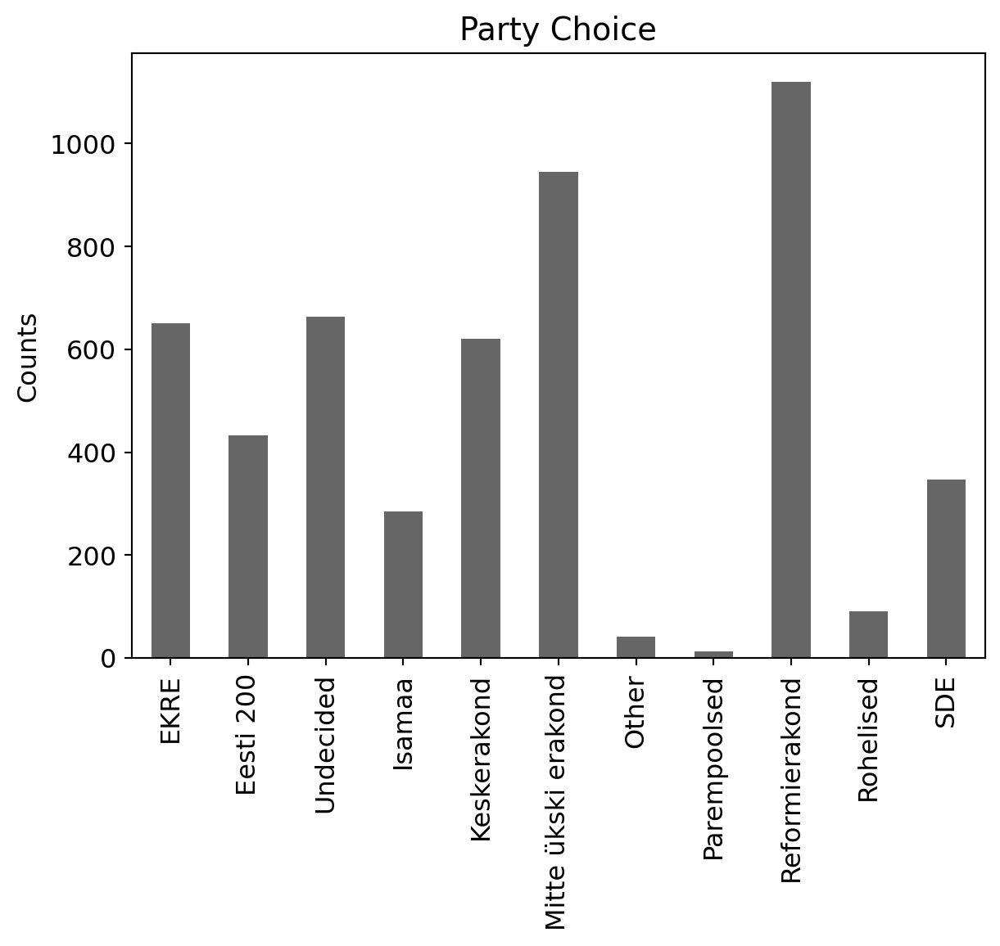

In [11]:
data.loc[:, 'EKRE':].sum(axis=0).plot(kind='bar', title='Party Choice', ylabel='Counts', color='black', alpha=0.6);

In [12]:
data.electoral_district.unique().size, data.unit.unique().size

(12, 24)

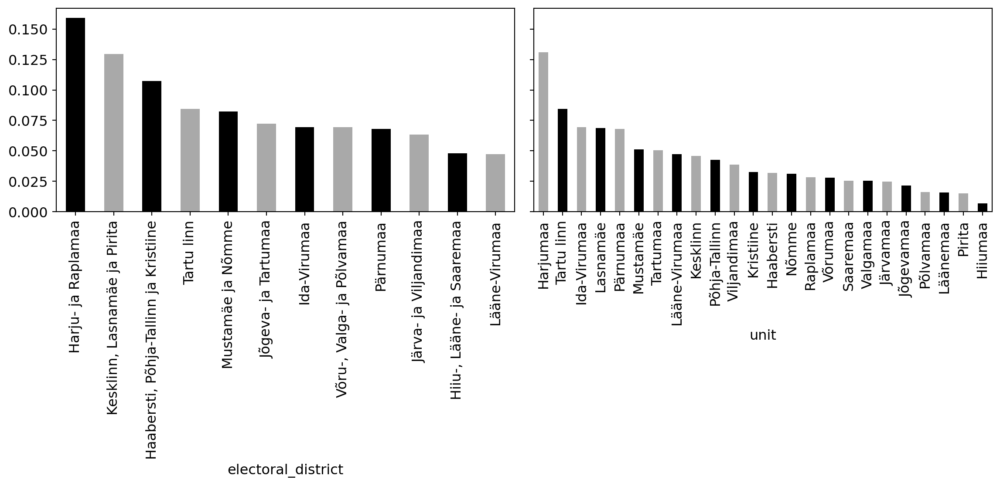

In [13]:
f, (left, right) = pp.subplots(ncols=2, figsize=(12, 6), sharey=True)
data.electoral_district.value_counts(normalize=True).plot(kind='bar', color=['black', 'darkgray'], ax=left)
data.unit.value_counts(normalize=True).plot(kind='bar', color=['darkgray', 'black'])
left.set_xticklabels(left.get_xticklabels(), rotation=90)
f.tight_layout();

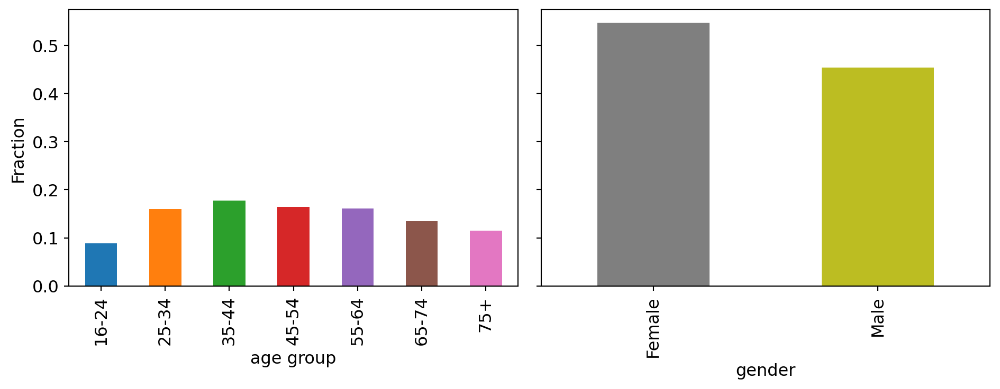

In [14]:
f, (left, right) = pp.subplots(ncols=2, figsize=(10, 4), sharey=True)
data.age_group.value_counts(normalize=True, sort=False).plot(kind='bar', color=[f'C{i}' for i in range(7)], ax=left);
data.gender.value_counts(normalize=True).plot(kind='bar', color= ['C7', 'C8'], ax=right)
left.set(ylabel='Fraction', xlabel='age group')
f.tight_layout()

In [15]:
data.education.value_counts()

education
Secondary education    2684
Higher education       1948
Basic education         574
Name: count, dtype: int64

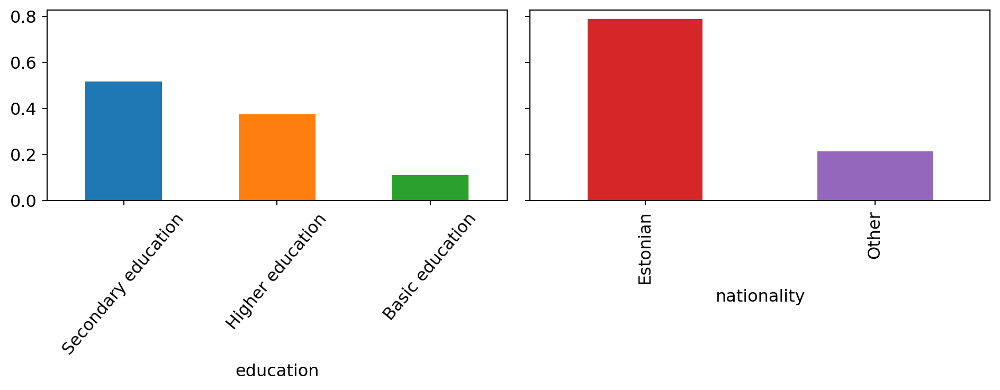

In [16]:
f, (left, right) = pp.subplots(ncols=2, figsize=(10, 4), sharey=True)
data.education.value_counts(normalize=True).plot(kind='bar', color=[f'C{i}' for i in range(0, 3)], ax=left)
data.nationality.value_counts(normalize=True).plot(kind='bar', color=['C3', 'C4'])
left.set_xticklabels(left.get_xticklabels(), rotation=50)
f.tight_layout();

In [17]:
def make_group_percentage(df: pd.DataFrame, category: 'str') -> pd.DataFrame:
    """Computes percentage for each column in a group"""
    group = df.groupby(category).sum(numeric_only=True)
    group_percent = group.div(group.sum(axis=1), axis=0)*100
    return group_percent

In [18]:
party_names = data.loc[:, 'EKRE':].columns.tolist()
party_names

['EKRE',
 'Eesti 200',
 'Undecided',
 'Isamaa',
 'Keskerakond',
 'Mitte ükski erakond',
 'Other',
 'Parempoolsed',
 'Reformierakond',
 'Rohelised',
 'SDE']

In [19]:
data.head()

,age_group,education,gender,nationality,electoral_district,unit,EKRE,Eesti 200,Undecided,Isamaa,Keskerakond,Mitte ükski erakond,Other,Parempoolsed,Reformierakond,Rohelised,SDE
0,16-24,Basic education,Male,Estonian,"Haabersti, Põhja-Tallinn ja Kristiine",Kristiine,0,0,0,0,0,1,0,0,0,0,0
1,16-24,Basic education,Male,Estonian,Harju- ja Raplamaa,Harjumaa,0,0,0,0,0,0,0,0,1,0,0
2,16-24,Basic education,Male,Estonian,Harju- ja Raplamaa,Harjumaa,0,0,0,0,0,0,0,0,0,0,1
3,16-24,Basic education,Male,Estonian,Harju- ja Raplamaa,Harjumaa,1,0,0,0,0,0,0,0,0,0,0
4,16-24,Basic education,Male,Estonian,Harju- ja Raplamaa,Harjumaa,0,0,0,0,1,0,0,0,0,0,0


In [20]:
data.groupby('gender').sum(
numeric_only=True
)

,EKRE,Eesti 200,Undecided,Isamaa,Keskerakond,Mitte ükski erakond,Other,Parempoolsed,Reformierakond,Rohelised,SDE
gender,,,,,,,,,,,
Female,271,237,412,119,374,507,18,7,620,55,225
Male,379,195,251,165,247,438,23,5,500,36,122


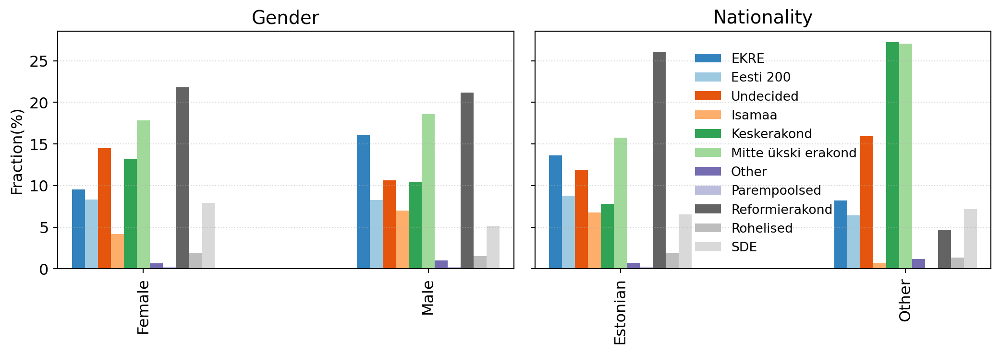

In [21]:
f, (left, right) = pp.subplots(ncols=2, figsize=(11, 4), sharey=True)
#gender = data.groupby('gender').sum(numeric_only=True)
#(gender.div(gender.sum(axis=1), axis=0)*100).plot(kind='bar', colormap='tab20c', ax=left, legend=False)
#data.groupby('nationality').sum(numeric_only=True).plot(kind='bar', colormap='tab20c', ax=right, legend=False)
make_group_percentage(data, 'gender').plot(kind='bar', colormap='tab20c', ax=left, legend=False)
make_group_percentage(data, 'nationality').plot(kind='bar', colormap='tab20c', ax=right)
left.set(title='Gender', ylabel='Fraction(%)', xlim=(-0.3, 1.3), xlabel='')
right.set(xlim=(-0.3, 1.3), title='Nationality', xlabel='')
right.legend(frameon=False, loc=(0.34 ,0.04), fontsize=10)
right.grid(axis='y', alpha=0.5, ls=':')
left.grid(axis='y', alpha=0.5, ls=':')
f.tight_layout();

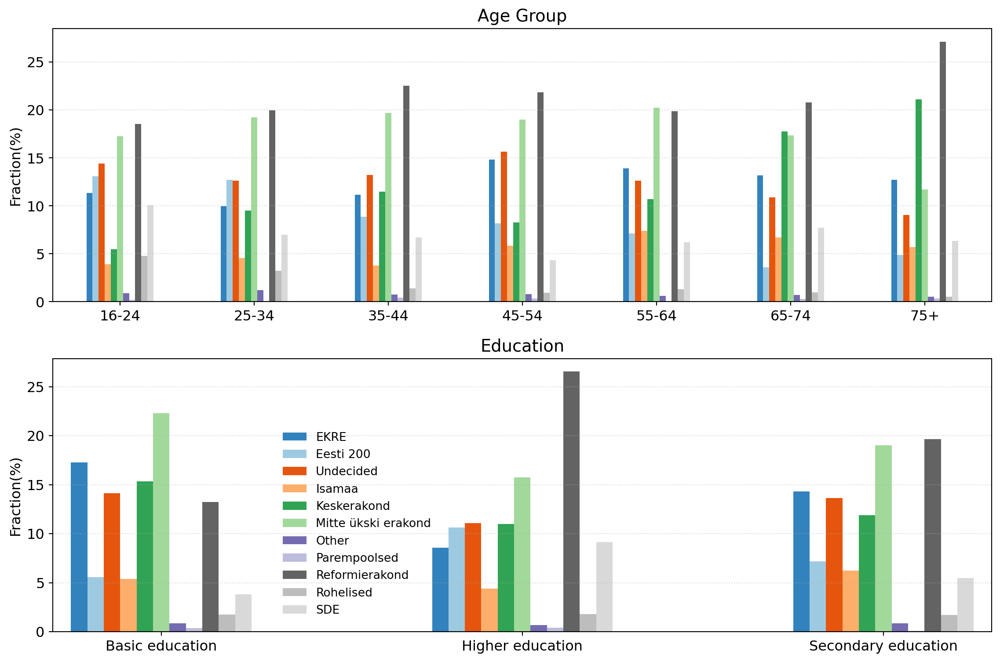

In [22]:
f, (top, bottom) = pp.subplots(nrows=2, figsize=(12, 8))
#data.groupby('age_group').sum(numeric_only=True)
make_group_percentage(data, 'age_group').plot(kind='bar', colormap='tab20c', ax=top, legend=False)
#data.groupby('education').sum(numeric_only=True)
make_group_percentage(data, 'education').plot(kind='bar', colormap='tab20c', ax=bottom, legend=False, )
top.set(title='Age Group', ylabel='Fraction(%)', xlabel='')
top.set_xticklabels(top.get_xticklabels(), rotation=0)
bottom.legend(frameon=False,  loc=(0.24, 0.04), fontsize=10)
bottom.set_xticklabels(bottom.get_xticklabels(), rotation=0)
bottom.set(ylabel='Fraction(%)', title='Education', xlim=(-0.3, 2.3), xlabel='')
bottom.grid(axis='y', alpha=0.5, ls=':')
top.grid(axis='y', alpha=0.5, ls=':')
f.tight_layout();

In [23]:
# response variable encoding
party_choice = pd.Categorical(data[party_names].idxmax(axis=1), categories=party_names, ordered=True)
party_choice_label = party_choice.categories.to_list()
party_choice_code = party_choice.codes

# input variables encoding
education_code, education_label = data.education.factorize(sort=True) 
nationality_code, nationality_label = data.nationality.factorize(sort=True)

# setting model coordinates

coords = {
    'party_choice': party_choice_label,
    'education': education_label,
    'nationality': nationality_label,
    'obs_idx': data.index} # observation index, the row location of an observation in the dataframe.

In [24]:
def build_model1(α_sigma=1, α_nat_sigma=1, α_edu_sigma=1):
    with pm.Model(coords=coords) as model1:
        # Data containers
        party_choice_idx = pm.Data('party_choice_index', party_choice_code, dims='obs_idx')
        nationality_idx = pm.Data('nationality_index', nationality_code, dims='obs_idx')
        education_idx = pm.Data('eductation_index', education_code, dims='obs_idx')
        
        # Model priors
        # baseline
        α = pm.ZeroSumNormal('α', sigma=α_sigma, dims='party_choice') 
        # baseline offset due to nationality
        α_nationality = pm.ZeroSumNormal('α_nationality', sigma=α_nat_sigma, dims=('nationality', 'party_choice'), n_zerosum_axes=2) 
        # baseline offset due to education
        α_education = pm.ZeroSumNormal('α_education', sigma=α_edu_sigma, dims=('education', 'party_choice'), n_zerosum_axes=2)

        # Link function for choice probability
        p = pm.math.softmax(α + α_nationality[nationality_idx] + α_education[education_idx], axis=-1)
        
        # Likelihood
        _ = pm.Categorical('y', p=p, observed=party_choice_idx, dims='obs_idx')
    return model1

In [25]:
model1 = build_model1()

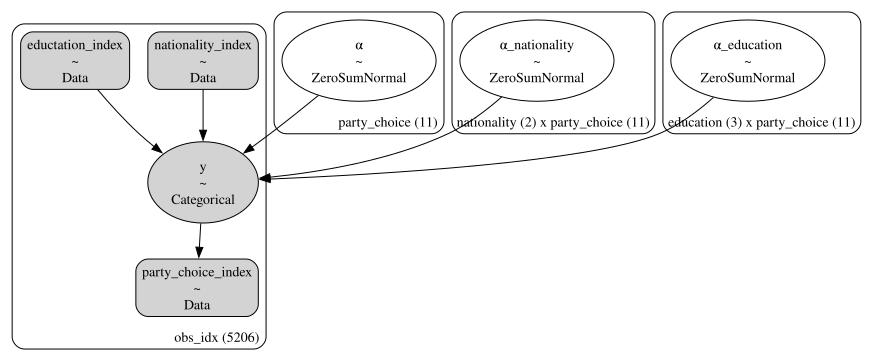

In [26]:
model1.to_graphviz()

In [27]:
with model1:
    idata1 = pm.sample_prior_predictive(model=model1)
    idata1.extend(pm.sample(chains=4, draws=2000, random_seed=42))
    idata1.extend(pm.sample_posterior_predictive(idata1))

Sampling: [y, α, α_education, α_nationality]


Initializing NUTS using jitter+adapt_diag...


Multiprocess sampling (4 chains in 4 jobs)


NUTS: [α, α_nationality, α_education]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 88 seconds.


Sampling: [y]


Output()

In [28]:
def plot_forward_samples(
        idata: az.InferenceData, categories:list, categories_name:str, 
        figsize=(12, 6), plot_prior=True, plot_posterior=True):
    """A quick function to plot model predictives. """
    f, (left, right) = pp.subplots(1, 2, figsize=figsize, sharey=True)
    xticks = [i + 0.5 for i in range(len(categories))]
    if plot_prior:
        az.plot_ppc(idata, group="prior", ax=left)
        left.set(
            xticks=xticks,
        )
        left.set_xticklabels(categories, fontsize=10, rotation=30)
        left.set_xlabel(categories_name, fontsize=16)
        left.legend(frameon=True, fontsize=11)
    else:
        left.set_visible(False)

    if plot_posterior:
        az.plot_ppc(idata, ax=right)
        right.set(
            xticks=xticks,
        )
        right.set_xticklabels(categories, fontsize=10, rotation=30)
        right.set_xlabel(categories_name, fontsize=16)
        right.legend(frameon=True, fontsize=11)
    else:
        right.set_visible(False)
    f.tight_layout()
    return f, (left, right)

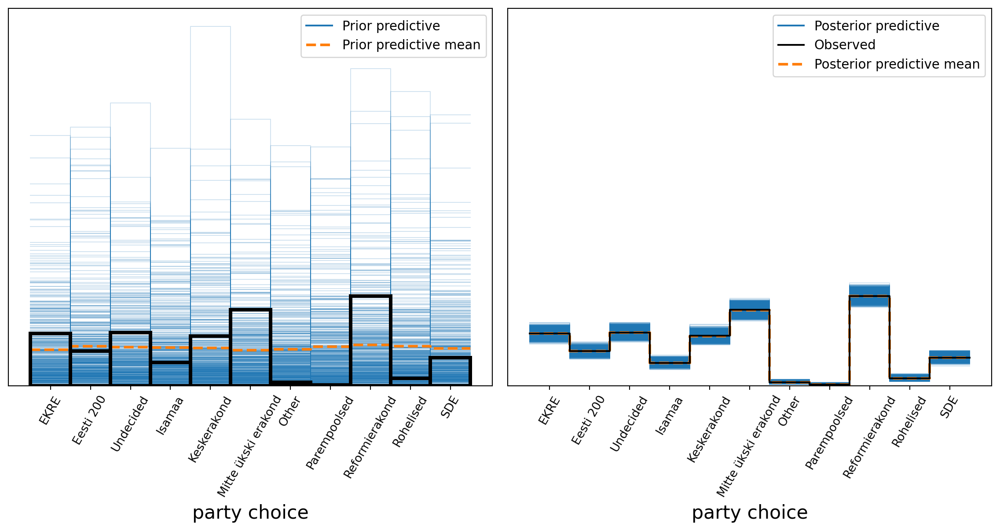

In [29]:
mean_win = pd.Series(party_choice_code).value_counts(normalize=True).round(3).sort_index()
f, (axl, axr) = plot_forward_samples(idata1, categories=party_choice_label, categories_name='party choice', figsize=(12, 6))
axl.set_xticklabels(axl.get_xticklabels(), rotation=60);
axl.bar(x=axl.get_xticks(), height=mean_win.values,  color='k', fill=False, lw=3, width=1, zorder=13, label='data');
axr.set_xticklabels(axr.get_xticklabels(), rotation=60);

In [30]:
model1b = build_model1(α_sigma=0.5, α_edu_sigma=0.2, α_nat_sigma=0.3)

In [31]:
with model1b:
    idata1b = pm.sample_prior_predictive()
    idata1b.extend(pm.sample(chains=4, draws=2000, random_seed=42))
    idata1b.extend(pm.sample_posterior_predictive(idata1b))

Sampling: [y, α, α_education, α_nationality]


Initializing NUTS using jitter+adapt_diag...


Multiprocess sampling (4 chains in 4 jobs)


NUTS: [α, α_nationality, α_education]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 78 seconds.


Sampling: [y]


Output()

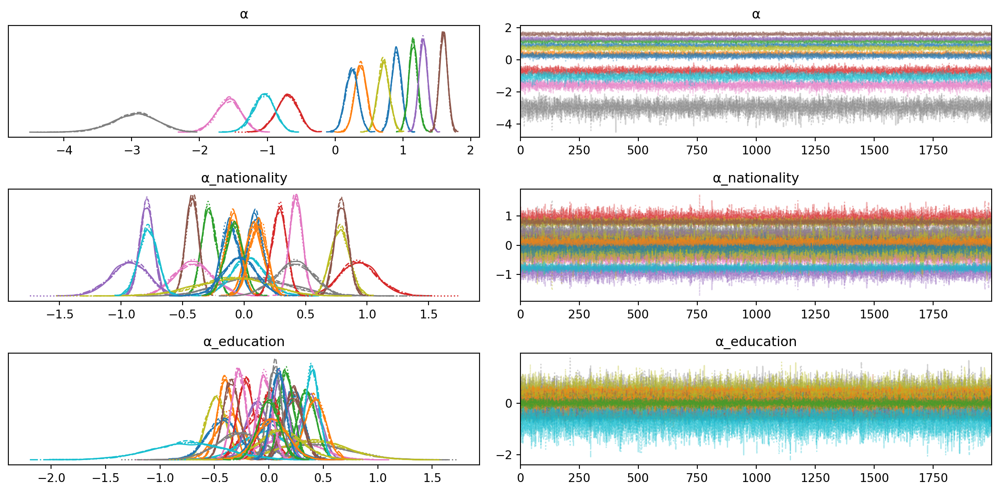

In [32]:
az.plot_trace(idata1, backend_kwargs={'tight_layout': True});

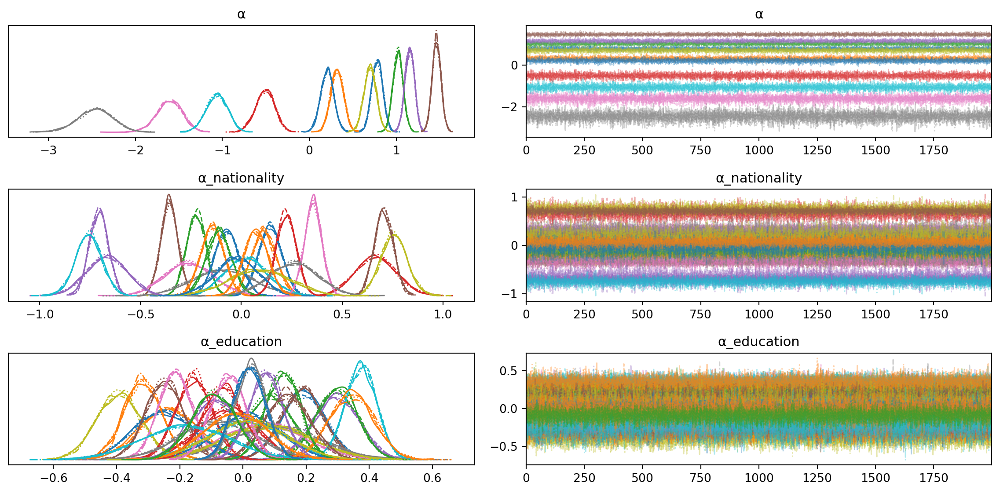

In [33]:
az.plot_trace(idata1b, backend_kwargs=dict(tight_layout=True));

In [34]:
az.summary(idata1, var_names='α')

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
α[EKRE],0.906,0.072,0.772,1.042,0.001,0.001,6612.0,6756.0,1.0
α[Eesti 200],0.377,0.087,0.222,0.549,0.001,0.001,6715.0,6112.0,1.0
α[Undecided],1.153,0.067,1.021,1.277,0.001,0.001,6441.0,6223.0,1.0
α[Isamaa],-0.710,0.160,-1.000,-0.405,0.002,0.001,8356.0,6113.0,1.0
α[Keskerakond],1.302,0.063,1.178,1.415,0.001,0.001,6106.0,6320.0,1.0
α[Mitte ükski erakond],1.599,0.059,1.486,1.709,0.001,0.001,5842.0,5910.0,1.0
α[Other],-1.575,0.180,-1.900,-1.225,0.002,0.001,10091.0,6406.0,1.0
α[Parempoolsed],-2.961,0.326,-3.584,-2.365,0.004,0.003,5747.0,6096.0,1.0
α[Reformierakond],0.716,0.084,0.552,0.865,0.001,0.001,8024.0,6563.0,1.0
α[Rohelised],-1.054,0.156,-1.340,-0.752,0.002,0.001,8262.0,6252.0,1.0


In [35]:
az.summary(idata1b, var_names='α')

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
α[EKRE],0.781,0.064,0.660,0.899,0.001,0.000,12336.0,6688.0,1.0
α[Eesti 200],0.320,0.073,0.176,0.452,0.001,0.001,10479.0,6316.0,1.0
α[Undecided],1.020,0.058,0.907,1.126,0.001,0.000,10735.0,6572.0,1.0
α[Isamaa],-0.509,0.109,-0.723,-0.310,0.001,0.001,10705.0,5825.0,1.0
α[Keskerakond],1.155,0.055,1.049,1.253,0.001,0.000,10455.0,6907.0,1.0
α[Mitte ükski erakond],1.464,0.051,1.370,1.563,0.001,0.000,9276.0,6427.0,1.0
α[Other],-1.609,0.147,-1.889,-1.333,0.001,0.001,12469.0,6006.0,1.0
α[Parempoolsed],-2.461,0.202,-2.849,-2.089,0.002,0.001,10961.0,5924.0,1.0
α[Reformierakond],0.698,0.071,0.563,0.830,0.001,0.000,10962.0,6083.0,1.0
α[Rohelised],-1.065,0.121,-1.295,-0.843,0.001,0.001,10573.0,6503.0,1.0


In [36]:
az.summary(idata1, var_names='α_education')

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"α_education[Basic education, EKRE]",0.234,0.088,0.072,0.400,0.001,0.001,8337.0,6406.0,1.0
"α_education[Basic education, Eesti 200]",-0.359,0.125,-0.602,-0.134,0.001,0.001,8978.0,6077.0,1.0
"α_education[Basic education, Undecided]",0.110,0.091,-0.052,0.290,0.001,0.001,8579.0,6639.0,1.0
"α_education[Basic education, Isamaa]",-0.110,0.129,-0.352,0.129,0.001,0.001,12807.0,6272.0,1.0
"α_education[Basic education, Keskerakond]",0.385,0.091,0.212,0.555,0.001,0.001,7640.0,6648.0,1.0
"α_education[Basic education, Mitte ükski erakond]",0.226,0.082,0.067,0.376,0.001,0.001,6905.0,6441.0,1.0
"α_education[Basic education, Other]",0.148,0.276,-0.357,0.665,0.003,0.003,9166.0,5883.0,1.0
"α_education[Basic education, Parempoolsed]",0.332,0.382,-0.402,1.037,0.004,0.003,9250.0,6320.0,1.0
"α_education[Basic education, Reformierakond]",-0.486,0.092,-0.658,-0.317,0.001,0.001,9580.0,6485.0,1.0
"α_education[Basic education, Rohelised]",-0.054,0.205,-0.446,0.317,0.002,0.002,10698.0,6133.0,1.0


In [37]:
az.summary(idata1b, var_names='α_education')

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"α_education[Basic education, EKRE]",0.191,0.070,0.055,0.320,0.001,0.000,13539.0,6375.0,1.0
"α_education[Basic education, Eesti 200]",-0.235,0.090,-0.400,-0.062,0.001,0.001,11990.0,7072.0,1.0
"α_education[Basic education, Undecided]",0.083,0.073,-0.060,0.214,0.001,0.001,12012.0,6297.0,1.0
"α_education[Basic education, Isamaa]",-0.050,0.093,-0.231,0.118,0.001,0.001,13607.0,6170.0,1.0
"α_education[Basic education, Keskerakond]",0.295,0.074,0.156,0.434,0.001,0.000,12671.0,6260.0,1.0
"α_education[Basic education, Mitte ükski erakond]",0.189,0.066,0.060,0.309,0.001,0.000,12424.0,6586.0,1.0
"α_education[Basic education, Other]",0.065,0.135,-0.184,0.323,0.001,0.001,13651.0,6458.0,1.0
"α_education[Basic education, Parempoolsed]",0.097,0.144,-0.174,0.365,0.001,0.001,13581.0,5944.0,1.0
"α_education[Basic education, Reformierakond]",-0.393,0.070,-0.517,-0.256,0.001,0.000,11899.0,6095.0,1.0
"α_education[Basic education, Rohelised]",0.009,0.122,-0.223,0.228,0.001,0.001,13491.0,6665.0,1.0


In [38]:
az.summary(idata1, var_names='α_nationality')

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"α_nationality[Estonian, EKRE]",0.091,0.064,-0.031,0.210,0.001,0.001,7281.0,6421.0,1.0
"α_nationality[Estonian, Eesti 200]",0.081,0.072,-0.059,0.213,0.001,0.001,8736.0,6470.0,1.0
"α_nationality[Estonian, Undecided]",-0.287,0.058,-0.394,-0.182,0.001,0.001,6742.0,6367.0,1.0
"α_nationality[Estonian, Isamaa]",0.935,0.151,0.660,1.228,0.002,0.001,8963.0,5827.0,1.0
"α_nationality[Estonian, Keskerakond]",-0.791,0.056,-0.888,-0.677,0.001,0.000,6695.0,6262.0,1.0
"α_nationality[Estonian, Mitte ükski erakond]",-0.422,0.052,-0.520,-0.327,0.001,0.000,6279.0,6162.0,1.0
"α_nationality[Estonian, Other]",-0.407,0.155,-0.703,-0.120,0.001,0.001,12316.0,6225.0,1.0
"α_nationality[Estonian, Parempoolsed]",0.095,0.292,-0.427,0.655,0.004,0.003,5923.0,5253.0,1.0
"α_nationality[Estonian, Reformierakond]",0.780,0.076,0.639,0.921,0.001,0.001,8745.0,6390.0,1.0
"α_nationality[Estonian, Rohelised]",0.039,0.135,-0.209,0.290,0.001,0.001,10870.0,6037.0,1.0


In [39]:
az.summary(idata1b, var_names='α_nationality')

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"α_nationality[Estonian, EKRE]",0.144,0.057,0.039,0.251,0.001,0.000,12637.0,6667.0,1.0
"α_nationality[Estonian, Eesti 200]",0.112,0.062,-0.006,0.229,0.001,0.000,11945.0,6603.0,1.0
"α_nationality[Estonian, Undecided]",-0.223,0.049,-0.315,-0.136,0.000,0.000,11503.0,7039.0,1.0
"α_nationality[Estonian, Isamaa]",0.669,0.101,0.476,0.854,0.001,0.001,11064.0,6258.0,1.0
"α_nationality[Estonian, Keskerakond]",-0.707,0.046,-0.795,-0.621,0.000,0.000,11305.0,6511.0,1.0
"α_nationality[Estonian, Mitte ükski erakond]",-0.357,0.043,-0.439,-0.277,0.000,0.000,10679.0,6792.0,1.0
"α_nationality[Estonian, Other]",-0.260,0.121,-0.489,-0.035,0.001,0.001,12611.0,6075.0,1.0
"α_nationality[Estonian, Parempoolsed]",-0.091,0.153,-0.378,0.192,0.001,0.001,11387.0,6724.0,1.0
"α_nationality[Estonian, Reformierakond]",0.758,0.065,0.630,0.875,0.001,0.000,12215.0,6441.0,1.0
"α_nationality[Estonian, Rohelised]",0.026,0.105,-0.156,0.236,0.001,0.001,12021.0,6444.0,1.0


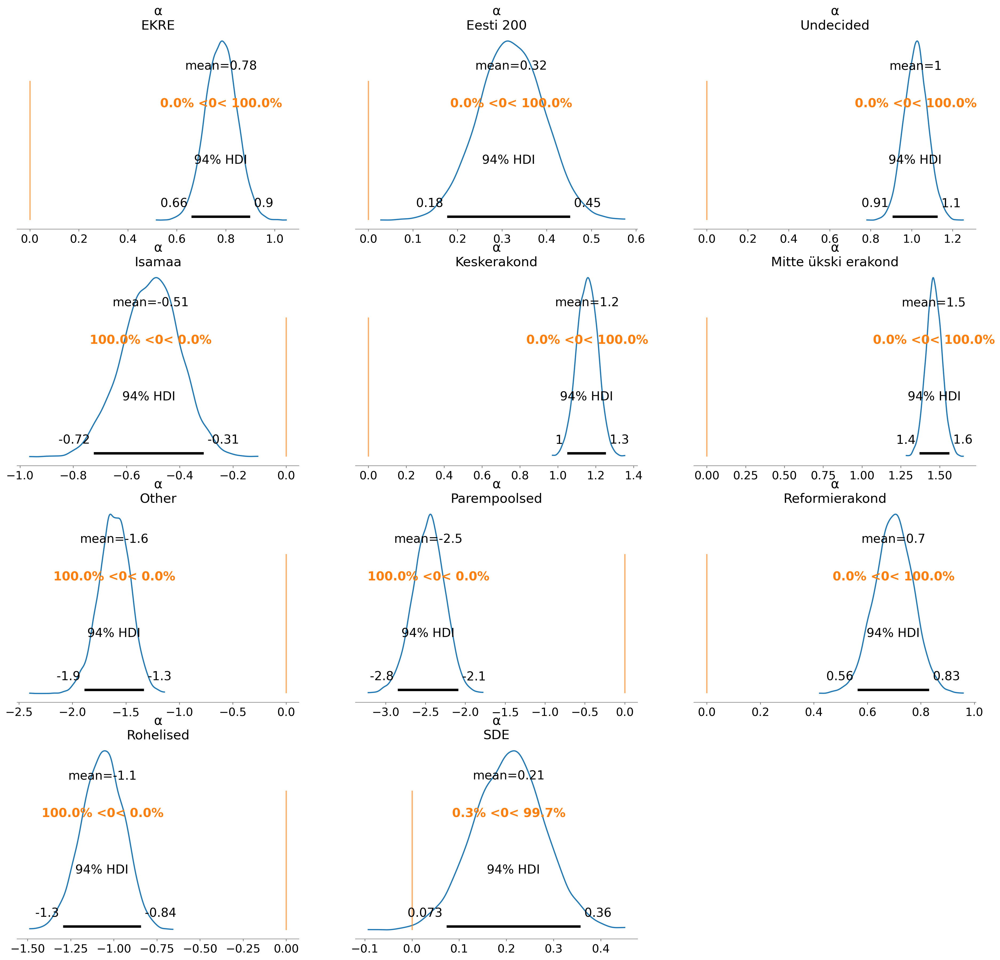

In [40]:
az.plot_posterior(idata1b, var_names='α', ref_val=0, textsize=16);

In [41]:
az.plot_posterior(idata1b, var_names='α_education', ref_val=0, backend_kwargs=dict(tight_layout=True), textsize=20);

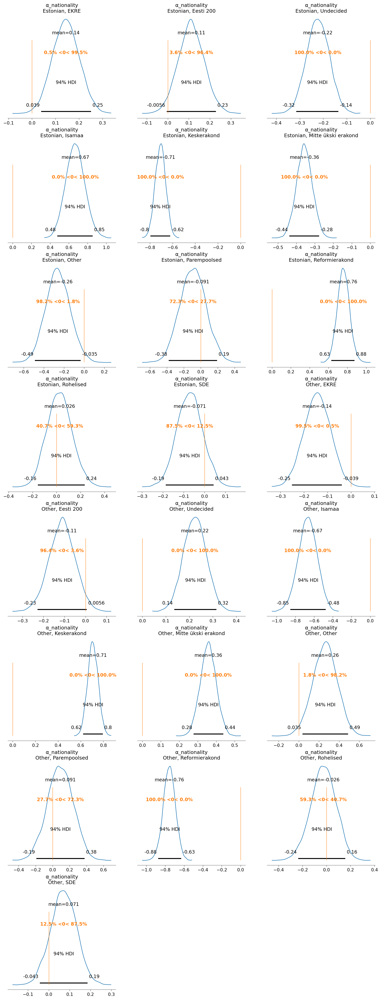

In [42]:
f, axs = pp.subplots(ncols=3, nrows=8, figsize=(15, 40))
for ax in axs.ravel()[-2:]:
    ax.set_visible(False)
az.plot_posterior(idata1b, var_names='α_nationality', backend_kwargs=dict(tight_layout=True), ref_val=0, ax=axs, textsize=10);


In [43]:
gender_code, gender_label = data.gender.factorize(sort=True)
age_gp_code, age_group_label = data.age_group.factorize(sort=True)

In [44]:
coords = {
    'age group': age_group_label,
    'education': education_label,
    'gender': gender_label,
    'nationality': nationality_label,
    'party choice': party_choice_label,
    'obs_idx': data.index
}

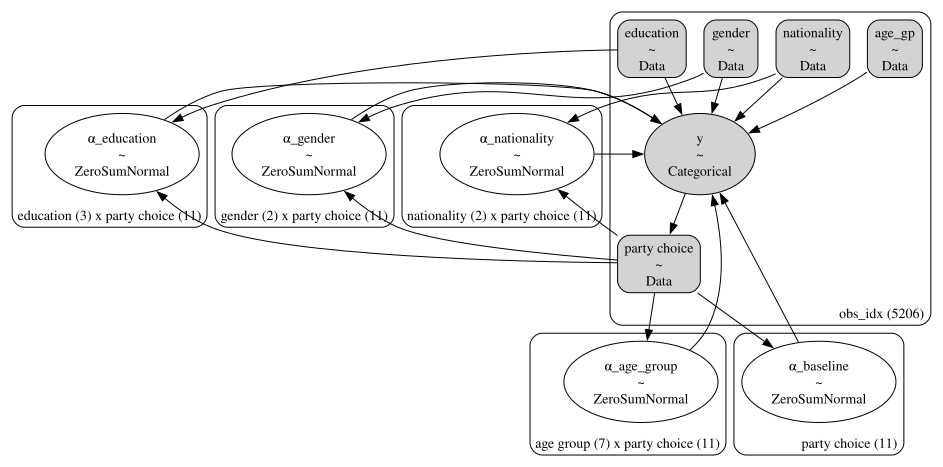

In [45]:
def build_model2(coords, σ_baseline=1, σ_age=1, σ_edu=1, σ_gen=1, σ_nat=1):
    with pm.Model(coords=coords) as model2:
        age_gp_idx = pm.Data('age_gp', age_gp_code, dims='obs_idx')
        educ_idx = pm.Data('education', education_code, dims='obs_idx')
        gender_idx = pm.Data('gender', gender_code, dims='obs_idx')
        nat_idx = pm.Data('nationality', nationality_code, dims='obs_idx')
        party_choice_idx = pm.Data('party choice', party_choice_code, dims='obs_idx') 
        
        α_baseline = pm.ZeroSumNormal('α_baseline', sigma=σ_baseline, dims='party choice')
        α_age_group = pm.ZeroSumNormal('α_age_group', sigma=σ_age, dims=('age group', 'party choice'), n_zerosum_axes=2)
        α_education = pm.ZeroSumNormal('α_education', sigma=σ_edu, dims=('education', 'party choice'), n_zerosum_axes=2)
        α_gender = pm.ZeroSumNormal('α_gender', sigma=σ_gen, dims=('gender', 'party choice'), n_zerosum_axes=2)
        α_nationality = pm.ZeroSumNormal('α_nationality', sigma=σ_nat, dims=('nationality', 'party choice'), n_zerosum_axes=2)

        μ = α_baseline + α_age_group[age_gp_idx] + α_education[educ_idx] + α_gender[gender_idx] + α_nationality[nat_idx]
        p = pm.math.softmax(μ, axis=-1)

        _ = pm.Categorical('y', p=p, observed=party_choice_idx, dims='obs_idx')
        
    return model2

model2 = build_model2(coords=coords, σ_baseline=0.3, σ_age=0.4, σ_edu=0.3, σ_gen=0.2, σ_nat=0.2)
model2.to_graphviz()

In [46]:
with model2:
    idata2 = pm.sample_prior_predictive()
    idata2.extend(pm.sample(chains=4, draws=2000, random_seed=42))
    idata2.extend(pm.sample_posterior_predictive(idata2))

Sampling: [y, α_age_group, α_baseline, α_education, α_gender, α_nationality]


Initializing NUTS using jitter+adapt_diag...


Multiprocess sampling (4 chains in 4 jobs)


NUTS: [α_baseline, α_age_group, α_education, α_gender, α_nationality]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 126 seconds.


Sampling: [y, α_age_group, α_baseline, α_education, α_gender, α_nationality]


Output()

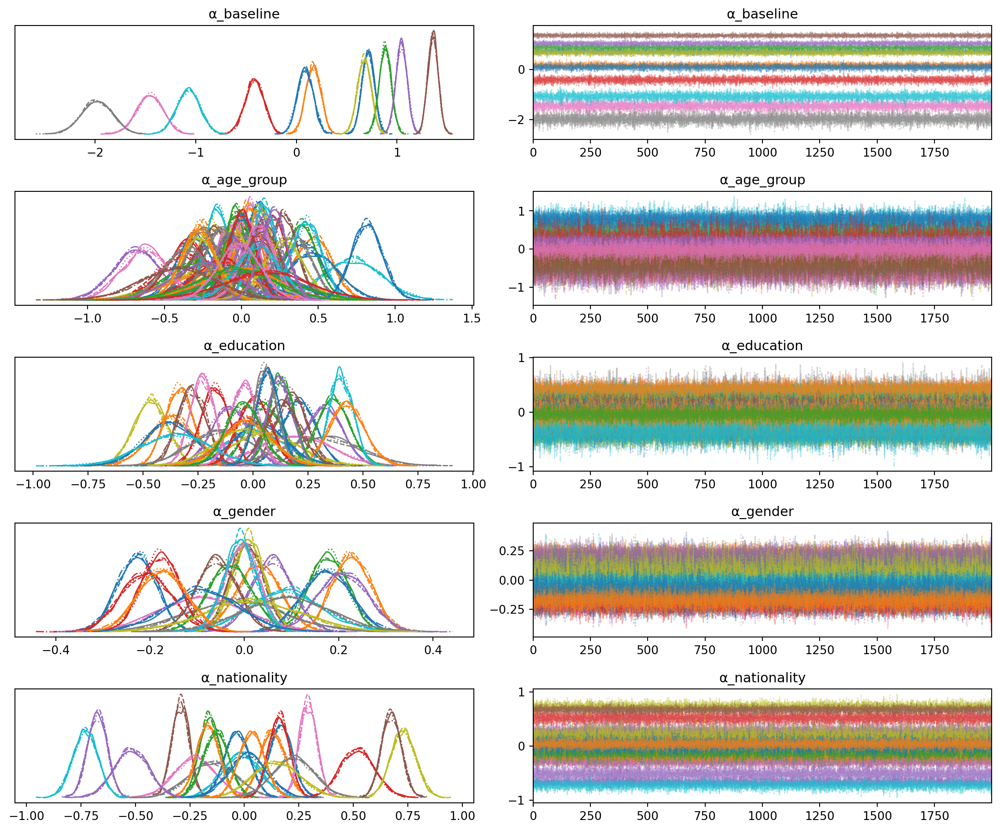

In [47]:
az.plot_trace(idata2, backend_kwargs=dict(tight_layout=True));

In [48]:
az.summary(idata2, var_names='α_baseline')

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
α_baseline[EKRE],0.713,0.061,0.598,0.826,0.001,0.000,13176.0,6608.0,1.0
α_baseline[Eesti 200],0.168,0.074,0.030,0.305,0.001,0.000,12135.0,6429.0,1.0
α_baseline[Undecided],0.882,0.059,0.772,0.995,0.001,0.000,13437.0,6458.0,1.0
α_baseline[Isamaa],-0.416,0.093,-0.586,-0.239,0.001,0.001,13360.0,6345.0,1.0
α_baseline[Keskerakond],1.044,0.056,0.944,1.157,0.000,0.000,14123.0,6809.0,1.0
α_baseline[Mitte ükski erakond],1.358,0.051,1.260,1.448,0.000,0.000,12378.0,7131.0,1.0
α_baseline[Other],-1.457,0.129,-1.695,-1.215,0.001,0.001,13204.0,6783.0,1.0
α_baseline[Parempoolsed],-1.982,0.151,-2.258,-1.695,0.001,0.001,14895.0,6244.0,1.0
α_baseline[Reformierakond],0.674,0.066,0.549,0.797,0.001,0.000,13091.0,6590.0,1.0
α_baseline[Rohelised],-1.073,0.113,-1.290,-0.866,0.001,0.001,13350.0,6760.0,1.0


In [49]:
az.summary(idata2, var_names='α_age_group')

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"α_age_group[16-24, EKRE]",-0.307,0.122,-0.537,-0.080,0.001,0.001,16900.0,5979.0,1.0
"α_age_group[16-24, Eesti 200]",0.465,0.121,0.240,0.696,0.001,0.001,16699.0,6892.0,1.0
"α_age_group[16-24, Undecided]",0.011,0.114,-0.205,0.225,0.001,0.001,14880.0,5789.0,1.0
"α_age_group[16-24, Isamaa]",-0.379,0.167,-0.684,-0.070,0.001,0.001,17991.0,5771.0,1.0
"α_age_group[16-24, Keskerakond]",-0.685,0.150,-0.959,-0.400,0.001,0.001,17828.0,5346.0,1.0
...,...,...,...,...,...,...,...,...,...
"α_age_group[75+, Other]",-0.044,0.252,-0.509,0.438,0.002,0.003,16116.0,5912.0,1.0
"α_age_group[75+, Parempoolsed]",0.156,0.279,-0.350,0.715,0.002,0.003,17245.0,6678.0,1.0
"α_age_group[75+, Reformierakond]",0.209,0.087,0.052,0.378,0.001,0.001,14009.0,6339.0,1.0
"α_age_group[75+, Rohelised]",-0.412,0.234,-0.838,0.033,0.002,0.002,14955.0,6332.0,1.0


In [50]:
az.summary(idata2, var_names='α_education')

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"α_education[Basic education, EKRE]",0.208,0.076,0.068,0.353,0.001,0.000,14723.0,6608.0,1.0
"α_education[Basic education, Eesti 200]",-0.371,0.102,-0.553,-0.172,0.001,0.001,12680.0,6619.0,1.0
"α_education[Basic education, Undecided]",0.053,0.080,-0.096,0.203,0.001,0.001,15074.0,7250.0,1.0
"α_education[Basic education, Isamaa]",-0.031,0.107,-0.235,0.164,0.001,0.001,14127.0,6301.0,1.0
"α_education[Basic education, Keskerakond]",0.321,0.084,0.165,0.476,0.001,0.000,15304.0,6390.0,1.0
"α_education[Basic education, Mitte ükski erakond]",0.175,0.069,0.044,0.305,0.001,0.000,14289.0,6947.0,1.0
"α_education[Basic education, Other]",0.187,0.166,-0.128,0.491,0.001,0.001,16358.0,5678.0,1.0
"α_education[Basic education, Parempoolsed]",0.304,0.177,-0.022,0.640,0.001,0.001,16022.0,6039.0,1.0
"α_education[Basic education, Reformierakond]",-0.466,0.077,-0.623,-0.336,0.001,0.000,15343.0,6863.0,1.0
"α_education[Basic education, Rohelised]",0.001,0.143,-0.281,0.261,0.001,0.002,17370.0,6133.0,1.0


In [51]:
az.summary(idata2, var_names='α_gender')

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"α_gender[Female, EKRE]",-0.228,0.041,-0.308,-0.157,0.000,0.000,17338.0,6441.0,1.0
"α_gender[Female, Eesti 200]",0.031,0.047,-0.057,0.118,0.000,0.000,16743.0,6071.0,1.0
"α_gender[Female, Undecided]",0.178,0.041,0.101,0.253,0.000,0.000,15502.0,6196.0,1.0
"α_gender[Female, Isamaa]",-0.209,0.053,-0.306,-0.110,0.000,0.000,18282.0,5863.0,1.0
"α_gender[Female, Keskerakond]",0.059,0.043,-0.023,0.139,0.000,0.000,17925.0,6789.0,1.0
"α_gender[Female, Mitte ükski erakond]",0.005,0.036,-0.062,0.072,0.000,0.000,13068.0,5882.0,1.0
"α_gender[Female, Other]",-0.089,0.092,-0.259,0.088,0.001,0.001,15853.0,5529.0,1.0
"α_gender[Female, Parempoolsed]",-0.018,0.101,-0.206,0.175,0.001,0.001,17983.0,6359.0,1.0
"α_gender[Female, Reformierakond]",0.009,0.035,-0.056,0.074,0.000,0.000,14718.0,6247.0,1.0
"α_gender[Female, Rohelised]",0.087,0.078,-0.056,0.237,0.001,0.001,17240.0,6054.0,1.0


In [52]:
az.summary(idata2, var_names='α_nationality')

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"α_nationality[Estonian, EKRE]",0.169,0.053,0.073,0.271,0.000,0.000,14414.0,6430.0,1.0
"α_nationality[Estonian, Eesti 200]",0.130,0.057,0.018,0.233,0.000,0.000,15715.0,7377.0,1.0
"α_nationality[Estonian, Undecided]",-0.159,0.046,-0.244,-0.072,0.000,0.000,14413.0,7107.0,1.0
"α_nationality[Estonian, Isamaa]",0.518,0.079,0.366,0.660,0.001,0.000,13569.0,6383.0,1.0
"α_nationality[Estonian, Keskerakond]",-0.675,0.045,-0.756,-0.590,0.000,0.000,14815.0,6751.0,1.0
"α_nationality[Estonian, Mitte ükski erakond]",-0.294,0.040,-0.373,-0.222,0.000,0.000,13450.0,6685.0,1.0
"α_nationality[Estonian, Other]",-0.225,0.095,-0.400,-0.044,0.001,0.001,16229.0,5764.0,1.0
"α_nationality[Estonian, Parempoolsed]",-0.145,0.106,-0.340,0.052,0.001,0.001,15378.0,6900.0,1.0
"α_nationality[Estonian, Reformierakond]",0.730,0.057,0.625,0.837,0.000,0.000,13500.0,6581.0,1.0
"α_nationality[Estonian, Rohelised]",-0.015,0.088,-0.183,0.145,0.001,0.001,14598.0,6308.0,1.0


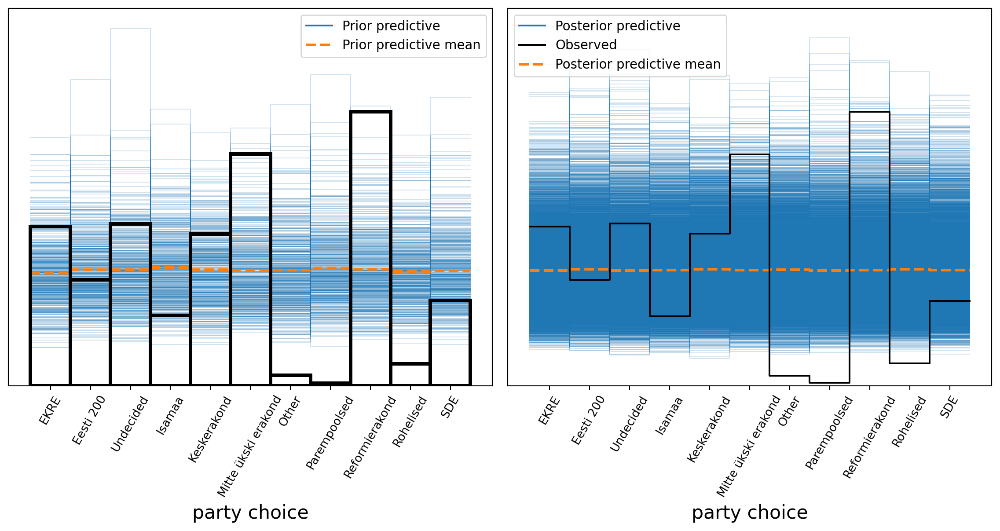

In [53]:
f, (axl, axr) = plot_forward_samples(idata2, categories=party_choice_label, categories_name='party choice', figsize=(12, 6))
axl.set_xticklabels(axl.get_xticklabels(), rotation=60);
axl.bar(x=axl.get_xticks(), height=mean_win.values,  color='k', fill=False, lw=3, width=1, zorder=13, label='data');
axr.set_xticklabels(axr.get_xticklabels(), rotation=60);